In [1]:
import numpy as np
import pandas as pd

import matplotlib.pyplot as plt
import seaborn as sns

import scanpy as sc
import squidpy as sq
import anndata as ad

import warnings

  
# Suppress implicit modification warnings
warnings.simplefilter("ignore", category=UserWarning)
warnings.simplefilter("ignore", category=FutureWarning)  



/software/cellgen/team298/ls34/vqgraph/lib/python3.10/site-packages/anndata/utils.py:429: FutureWarning: Importing read_csv from `anndata` is deprecated. Import anndata.io.read_csv instead.
  warnings.warn(msg, FutureWarning)
/software/cellgen/team298/ls34/vqgraph/lib/python3.10/site-packages/anndata/utils.py:429: FutureWarning: Importing read_excel from `anndata` is deprecated. Import anndata.io.read_excel instead.
  warnings.warn(msg, FutureWarning)
/software/cellgen/team298/ls34/vqgraph/lib/python3.10/site-packages/anndata/utils.py:429: FutureWarning: Importing read_hdf from `anndata` is deprecated. Import anndata.io.read_hdf instead.
  warnings.warn(msg, FutureWarning)
/software/cellgen/team298/ls34/vqgraph/lib/python3.10/site-packages/anndata/utils.py:429: FutureWarning: Importing read_loom from `anndata` is deprecated. Import anndata.io.read_loom instead.
  warnings.warn(msg, FutureWarning)
/software/cellgen/team298/ls34/vqgraph/lib/python3.10/site-packages/anndata/utils.py:429: 

In [2]:
import matplotlib

sc.settings.figdir = "fig1"
sc.settings.set_figure_params(dpi=50, dpi_save=300, facecolor="white", frameon=False, figsize=(18,18),
                              vector_friendly=True
                             )
matplotlib.rcParams['pdf.fonttype'] = 42
matplotlib.rcParams['ps.fonttype'] = 42

In [3]:
1100000+110522+145006+121220+190291+10920

1677959

In [3]:
PATH = '/nfs/team298/ls34/adult_skin/final_adatas/adata_combined_new.h5ad.final.filtered'




adata_5k=sc.read_h5ad(PATH)
adata_5k=adata_5k[adata_5k.obs["tech"]=="xenium"].copy()
def remove_markers(LIST):
    try: 
        LIST = {key: [gene for gene in genes if gene in adata_5k.var_names] 
                           for key, genes in LIST.items()}
    except: 
        LIST =[gene for gene in LIST if gene in adata_5k.var_names]
    return LIST


In [4]:
adata_5k.obs["Annotation"]=adata_5k.obs["lvl5_annotation"]
[x  for x in adata_5k.obs["Annotation"].unique() if x.startswith("KC_HF") ]


['KC_HF: ORS0',
 'KC_HF: Matrix',
 'KC_HF: HFSC',
 'KC_HF: IRS1',
 'KC_HF: ORS2',
 'KC_HF: SPON2+',
 'KC_HF: ORS1',
 'KC_HF: ORS_junction',
 'KC_HF: IRS_Cuticle',
 'KC_HF: HS',
 'KC_HF: IRS0']

# fig 1b

In [5]:
adata_hair = adata_5k[adata_5k.obs["Timepoint"]=="Day 14_HF"].copy()
adata_hair.obs.info_id6.value_counts()

info_id6
BK30_Day 14    30438
Name: count, dtype: int64

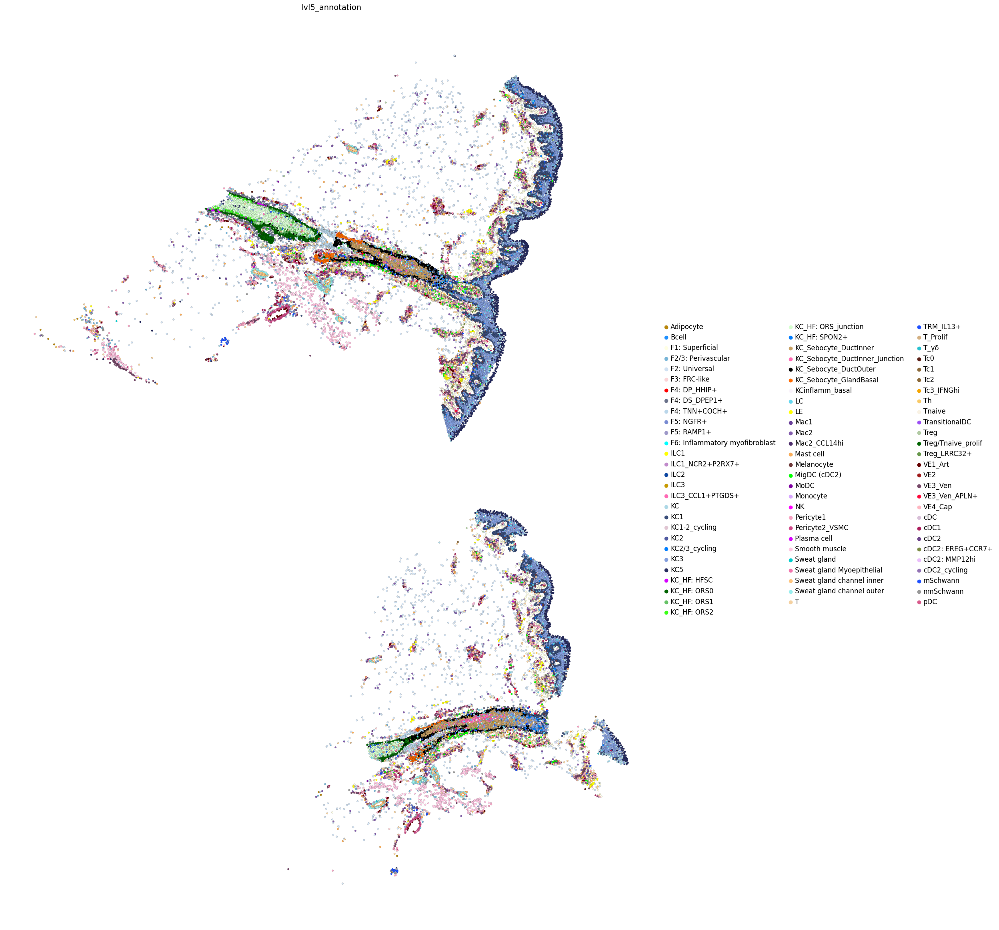

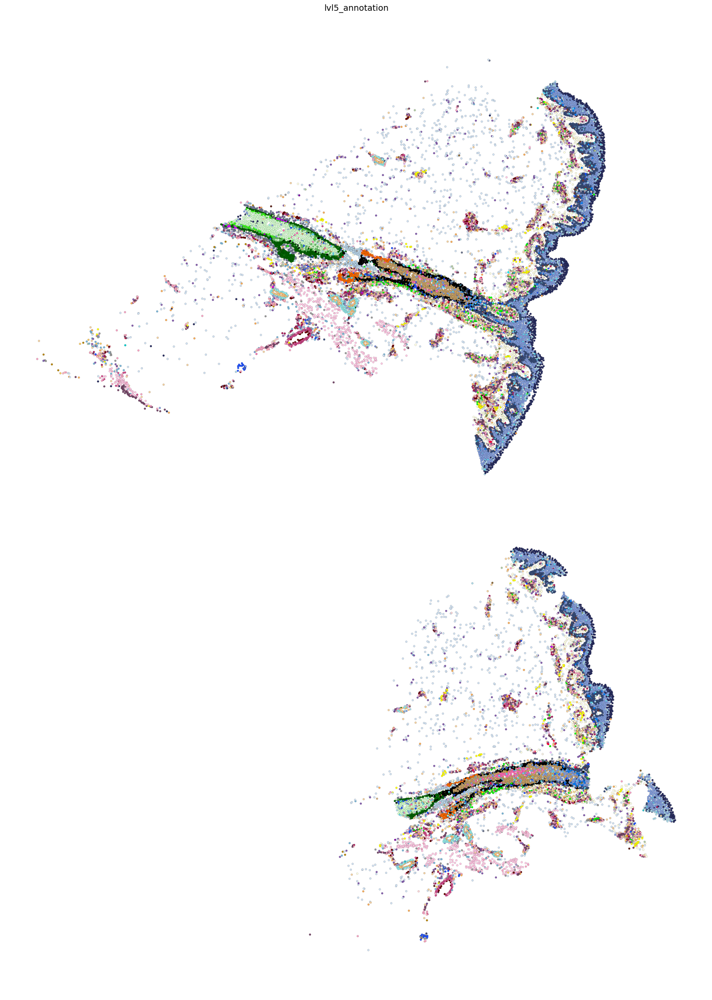

In [7]:
sc.settings.set_figure_params(dpi=50, dpi_save=600, facecolor="white", frameon=False, figsize=(30,30
                                                                                              ),
                              vector_friendly=True
                             )
SPOT_SIZE=15
sc.pl.spatial(
    adata_hair,#[adata_i.obs["Timepoint"].str.startswith("Les")],
    #library_id="spatial",
    #shape=None,
    color="lvl5_annotation",
    spot_size=SPOT_SIZE,
    vmax=1,
    #title=str(STATUS) + "_" + DONOR_ID,
    #title=INFO_ID, #+ "_nonlesional",
# legend_loc=None,
    # legend_loc="on data",
            edgecolor="black",
    linewidth=0.1,
            legend_fontsize=12,
    save=f"fig1b_celltype_legend_600dpi_spotsize{SPOT_SIZE}.pdf"

    #ax=ax,
    #legend_loc="on data"  # Disable the legend for each subplot
)



sc.pl.spatial(
    adata_hair,#[adata_i.obs["Timepoint"].str.startswith("Les")],
    #library_id="spatial",
    #shape=None,
    color="lvl5_annotation",
    spot_size=SPOT_SIZE,
    vmax=1,
    #title=str(STATUS) + "_" + DONOR_ID,
    #title=INFO_ID, #+ "_nonlesional",
     legend_loc=None,
    # legend_loc="on data",
            edgecolor="black",
    linewidth=0.1,
            legend_fontsize=12,
    save=f"fig1b_celltype_NOlegend_600dpi_spotsize{SPOT_SIZE}.pdf"

 
)

 
 

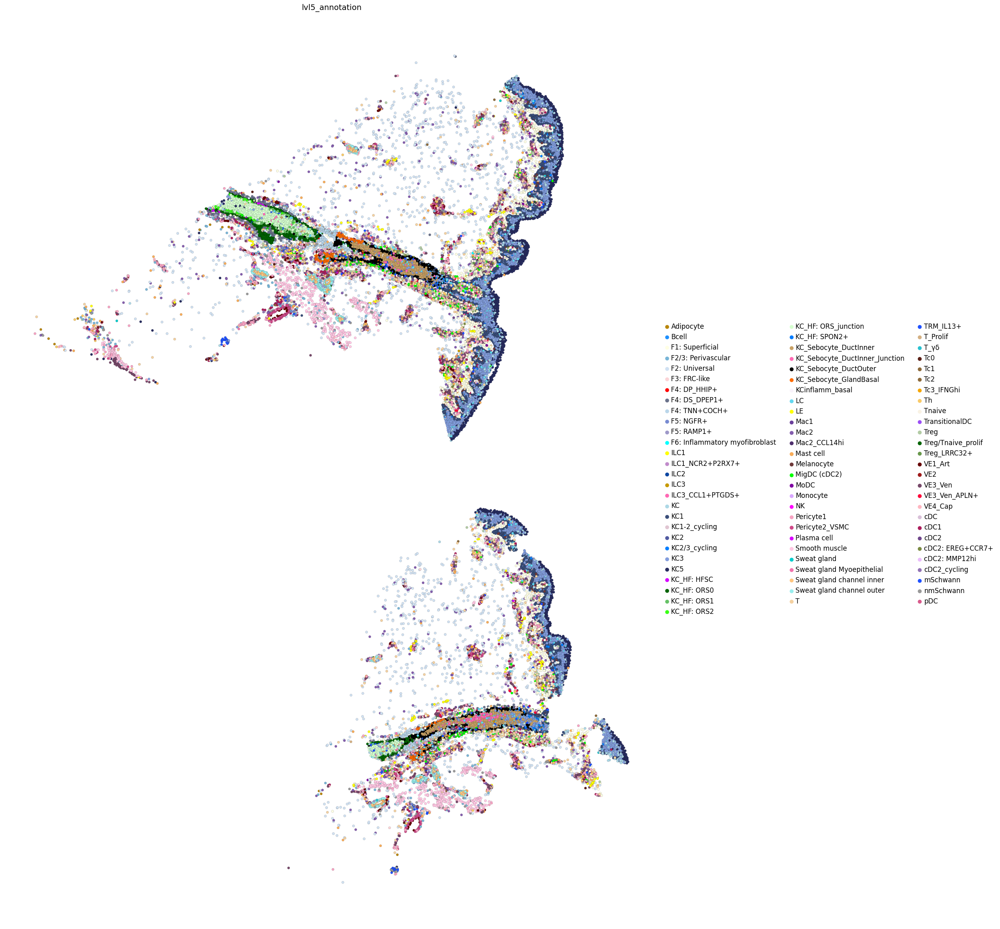

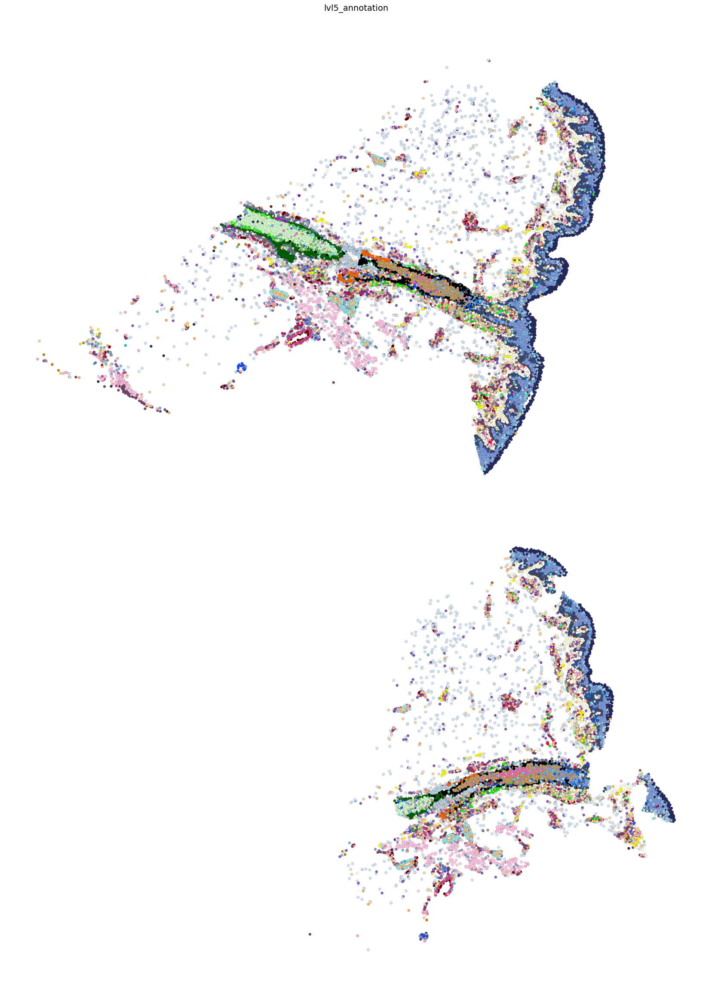

In [8]:
SPOT_SIZE=20
sc.pl.spatial(
    adata_hair,#[adata_i.obs["Timepoint"].str.startswith("Les")],
    #library_id="spatial",
    #shape=None,
    color="lvl5_annotation",
    spot_size=SPOT_SIZE,
    vmax=1,
    #title=str(STATUS) + "_" + DONOR_ID,
    #title=INFO_ID, #+ "_nonlesional",
# legend_loc=None,
    # legend_loc="on data",
            edgecolor="black",
    linewidth=0.1,
            legend_fontsize=12,
    save=f"fig1b_celltype_legend_600dpi_spotsize{SPOT_SIZE}.pdf"

    #ax=ax,
    #legend_loc="on data"  # Disable the legend for each subplot
)



sc.pl.spatial(
    adata_hair,#[adata_i.obs["Timepoint"].str.startswith("Les")],
    #library_id="spatial",
    #shape=None,
    color="lvl5_annotation",
    spot_size=SPOT_SIZE,
    vmax=1,
    #title=str(STATUS) + "_" + DONOR_ID,
    #title=INFO_ID, #+ "_nonlesional",
     legend_loc=None,
    # legend_loc="on data",
            edgecolor="black",
    linewidth=0.1,
            legend_fontsize=12,
    save=f"fig1b_celltype_NOlegend_600dpi_spotsize{SPOT_SIZE}.pdf"

 
)


sc.settings.set_figure_params(dpi=50, dpi_save=300, facecolor="white", frameon=False, figsize=(18,18),
                              vector_friendly=True
                             )

 
 

# fig 1c

In [9]:
adata_5k.obs["test"] = [x if x.startswith("KC_HF") or  x.startswith("KC_Sebo")  or  x.startswith("Smooth")  or  x.startswith("F4: TN") or  x.startswith("F4: DS")  or  x.startswith("Swea") else "Other" for x in adata_5k.obs["Annotation"]]

    

In [11]:
 
import pickle

file_path = '/nfs/team298/ls34/color_for_adult_skin2.pkl'

with open(file_path, 'rb') as file:
    palette_dict = pickle.load(file)



# fallback = "#BFBFBF"

# # make column categorical (once)
# adata_5k.obs["test"] = adata_5k.obs["test"].astype("category")

# cat_order   = list(adata_5k.obs["test"].cat.categories)
# palette_vec = [palette_dict.get(c, fallback) for c in cat_order]   # list, not dict
# adata_5k.uns["test_colors"] = palette_vec

 

In [11]:
# ad_i.obs["test"].value_counts()

BK49_Past Lesional


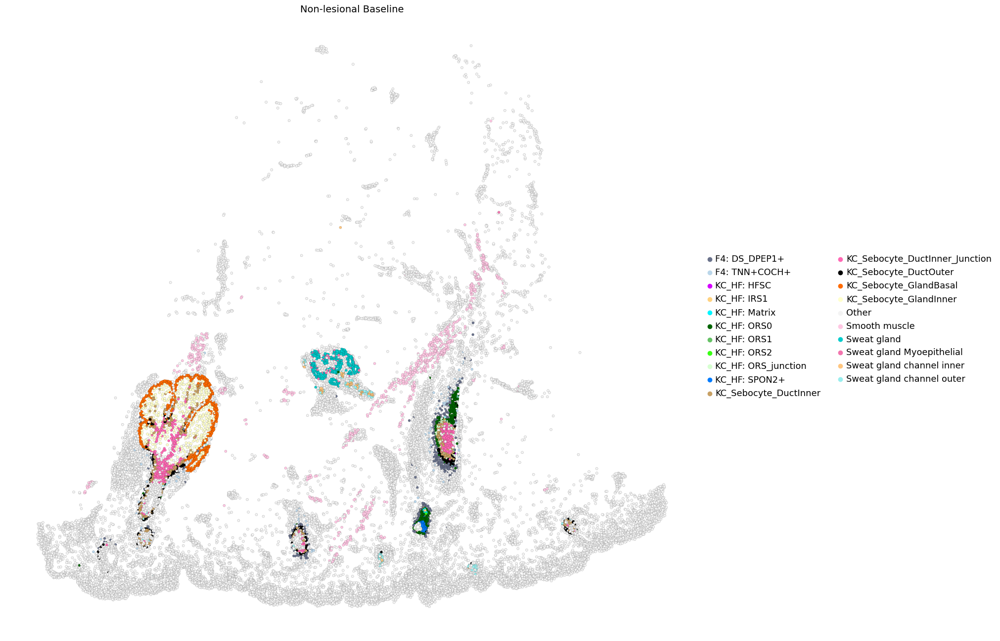

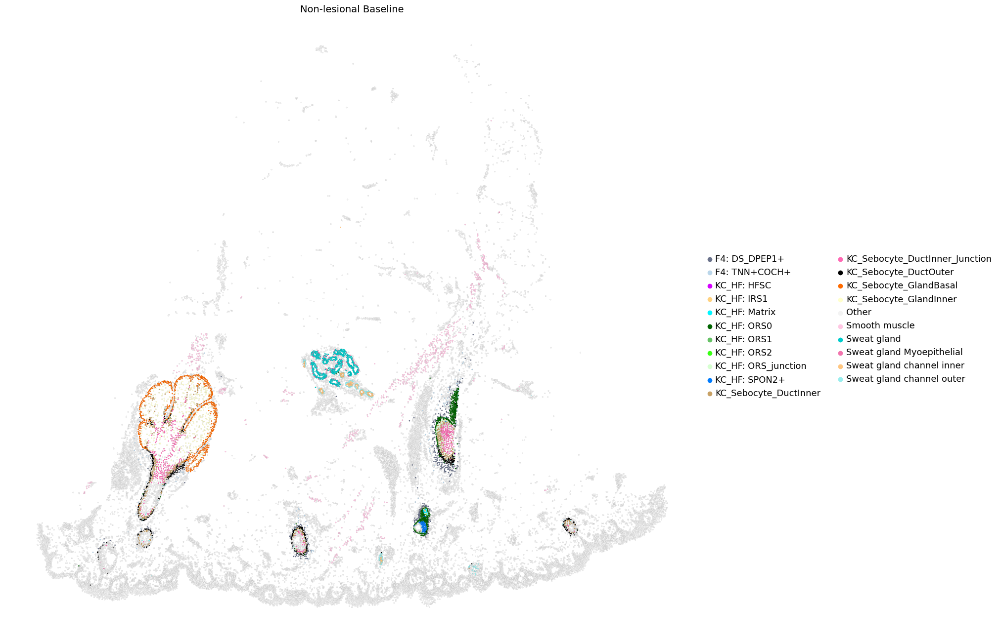

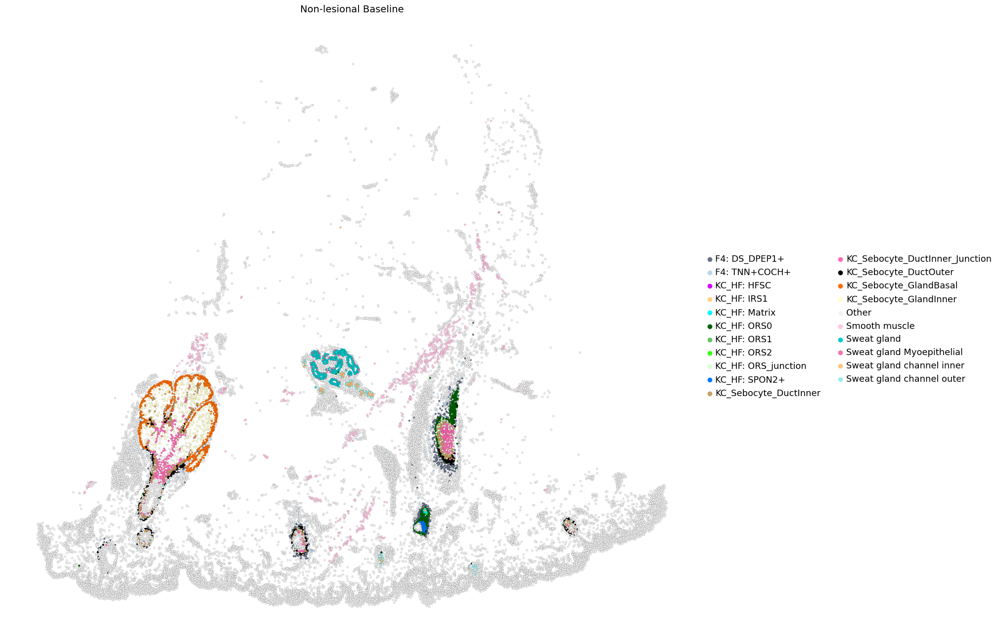

In [12]:
#sc.settings.set_figure_params(dpi=100, facecolor="white", frameon=False, figsize=(18,18))

fallback = "#BFBFBF"

# make column categorical (once)
adata_5k.obs["test"] = adata_5k.obs["test"].astype("category")

cat_order   = list(adata_5k.obs["test"].cat.categories)
palette_vec = [palette_dict.get(c, fallback) for c in cat_order]   # list, not dict
adata_5k.uns["test_colors"] = palette_vec


for sec in ["BK49_Past Lesional"]:
    ad_i = adata_5k[adata_5k.obs["info_id6"] == sec]
    #if CELL_TYPE not in ad_i.obs["test"].unique():
    #    continue
    #n = (ad_i.obs["test"] == CELL_TYPE).sum()
    #print(ad_i.shape, f"has cells ({CELL_TYPE}): ", n)
    #if n < MIN_CELL_COUNT:
    #    continue

    STATUS = ad_i.obs["Timepoint"].iloc[0]
    tissue_section_id = ad_i.obs["info_id2"].iloc[0]
    print(tissue_section_id)
#    
    sc.pl.spatial(
                    ad_i,
                    #library_id="spatial",
                    #shape=None,
                    color="test",
                    spot_size=SPOT_SIZE,
                    edgecolor="black",
                    linewidth=0.1,
                    vmax=1,
                    title=STATUS,# "\n" + tissue_section_id,
                    save="fig1c.pdf"
                   # palette=cmap,

                    #ax=ax,
                    #legend_loc="on data"  # Disable the legend for each subplot
                )
    
    sc.pl.spatial(
                    ad_i,
                    #library_id="spatial",
                    #shape=None,
                    color="test",
                    spot_size=10,
                    edgecolor="black",
                    linewidth=0.05,
                    vmax=1,
                    title=STATUS,# + "\n" + tissue_section_id,
                    save="fig1c_smaller.pdf"
                   # palette=cmap,

                    #ax=ax,
                    #legend_loc="on data"  # Disable the legend for each subplot
                )
    sc.pl.spatial(
                    ad_i,
                    #library_id="spatial",
                    #shape=None,
                    color="test",
                    spot_size=15,
                    edgecolor="black",
                    linewidth=0.1,
                    vmax=1,
                    title=STATUS,# + "\n" + tissue_section_id,
                    save="fig1c_bigger.pdf"
                   # palette=cmap,

                    #ax=ax,
                    #legend_loc="on data"  # Disable the legend for each subplot
                )

#sc.settings.set_figure_params(dpi=100, dpi_save=300, facecolor="white", frameon=False, figsize=(18,18))

    
    
    

In [13]:
STOP

NameError: name 'STOP' is not defined

# extended fig 3

In [ ]:
adata_5k.obs["test"] = [x if x.startswith("KC_HF") or  x.startswith("KC_Sebo")  or  x.startswith("Smooth")  or  x.startswith("F4")  or  x.startswith("Swea") else "Other" for x in adata_5k.obs["Annotation"]]

    

In [ ]:
adata_5k[adata_5k.obs["lvl5_annotation"]=="KC_HF: HFSC"].obs.info_id6.value_counts()

In [ ]:
import matplotlib

sc.settings.figdir = "fig1"
sc.settings.set_figure_params(dpi=300, dpi_save=300, facecolor="white", frameon=False, figsize=(18,18),
                              vector_friendly=True
                             )
matplotlib.rcParams['pdf.fonttype'] = 42
matplotlib.rcParams['ps.fonttype'] = 42

In [ ]:
adata_5k[adata_5k.obs["lvl5_annotation"]=="KC_HF: HS"].obs.info_id6.value_counts()

In [ ]:
#sc.settings.set_figure_params(dpi=100, facecolor="white", frameon=False, figsize=(18,18))

fallback = "#BFBFBF"

# make column categorical (once)
adata_5k.obs["test"] = adata_5k.obs["test"].astype("category")

cat_order   = list(adata_5k.obs["test"].cat.categories)
palette_vec = [palette_dict.get(c, fallback) for c in cat_order]   # list, not dict
adata_5k.uns["test_colors"] = palette_vec


for sec in ["Week 8 (resolved)_CE5-SKI-27-FO-4-S22_replicate"]:
    ad_i = adata_5k[adata_5k.obs["info_id6"] == sec]


  #  STATUS = ad_i.obs["Timepoint"].iloc[0]
   # tissue_section_id = ad_i.obs["info_id2"].iloc[0]
    print(tissue_section_id)
#    

    
#     sc.pl.spatial(
#                     ad_i,
#                     #library_id="spatial",
#                     #shape=None,
#                     color="test",
#                     spot_size=7,
#                     edgecolor="black",
#                     linewidth=0.1,
#                     vmax=1,
#                     title=sec,# + "\n" + tissue_section_id,
#                 #    save="fig1c_smaller.pdf"
#                    # palette=cmap,

#                     #ax=ax,
#                     #legend_loc="on data"  # Disable the legend for each subplot
#                 )
    sc.pl.spatial(
                    ad_i,
                    #library_id="spatial",
                    #shape=None,
                    color="test",
                    spot_size=10,
                    edgecolor="black",
                    linewidth=0.05,
                    vmax=1,
                    title=sec,# + "\n" + tissue_section_id,
                    #save="fig1c_bigger.pdf"
                   # palette=cmap,

                    #ax=ax,
                    #legend_loc="on data"  # Disable the legend for each subplot
                )

#sc.settings.set_figure_params(dpi=100, dpi_save=300, facecolor="white", frameon=False, figsize=(18,18))

    
    
    

In [ ]:
adata_5k[adata_5k.obs["lvl5_annotation"]=="KC_HF: Matrix"].obs.info_id6.value_counts()

In [ ]:
#sc.settings.set_figure_params(dpi=100, facecolor="white", frameon=False, figsize=(18,18))

fallback = "#BFBFBF"

# make column categorical (once)
adata_5k.obs["test"] = adata_5k.obs["test"].astype("category")

cat_order   = list(adata_5k.obs["test"].cat.categories)
palette_vec = [palette_dict.get(c, fallback) for c in cat_order]   # list, not dict
adata_5k.uns["test_colors"] = palette_vec


for sec in ["BK43_Never Lesional"]:
    ad_i = adata_5k[adata_5k.obs["info_id6"] == sec]


  #  STATUS = ad_i.obs["Timepoint"].iloc[0]
   # tissue_section_id = ad_i.obs["info_id2"].iloc[0]
    print(tissue_section_id)
#    

    
#     sc.pl.spatial(
#                     ad_i,
#                     #library_id="spatial",
#                     #shape=None,
#                     color="test",
#                     spot_size=7,
#                     edgecolor="black",
#                     linewidth=0.1,
#                     vmax=1,
#                     title=sec,# + "\n" + tissue_section_id,
#                 #    save="fig1c_smaller.pdf"
#                    # palette=cmap,

#                     #ax=ax,
#                     #legend_loc="on data"  # Disable the legend for each subplot
#                 )
    sc.pl.spatial(
                    ad_i,
                    #library_id="spatial",
                    #shape=None,
                    color="test",
                    spot_size=10,
                    edgecolor="black",
                    linewidth=0.05,
                    vmax=1,
                    title=sec,# + "\n" + tissue_section_id,
                    #save="fig1c_bigger.pdf"
                   # palette=cmap,

                    #ax=ax,
                    #legend_loc="on data"  # Disable the legend for each subplot
                )

#sc.settings.set_figure_params(dpi=100, dpi_save=300, facecolor="white", frameon=False, figsize=(18,18))

    
    
    

In [ ]:
#sc.settings.set_figure_params(dpi=100, facecolor="white", frameon=False, figsize=(18,18))

fallback = "#BFBFBF"

# make column categorical (once)
adata_5k.obs["test"] = adata_5k.obs["test"].astype("category")

cat_order   = list(adata_5k.obs["test"].cat.categories)
palette_vec = [palette_dict.get(c, fallback) for c in cat_order]   # list, not dict
adata_5k.uns["test_colors"] = palette_vec


for sec in ["BK30_Week 12"]:
    ad_i = adata_5k[adata_5k.obs["info_id6"] == sec]


  #  STATUS = ad_i.obs["Timepoint"].iloc[0]
   # tissue_section_id = ad_i.obs["info_id2"].iloc[0]
    print(tissue_section_id)
#    

    
#     sc.pl.spatial(
#                     ad_i,
#                     #library_id="spatial",
#                     #shape=None,
#                     color="test",
#                     spot_size=7,
#                     edgecolor="black",
#                     linewidth=0.1,
#                     vmax=1,
#                     title=sec,# + "\n" + tissue_section_id,
#                 #    save="fig1c_smaller.pdf"
#                    # palette=cmap,

#                     #ax=ax,
#                     #legend_loc="on data"  # Disable the legend for each subplot
#                 )
    sc.pl.spatial(
                    ad_i,
                    #library_id="spatial",
                    #shape=None,
                    color="test",
                    spot_size=10,
                    edgecolor="black",
                    linewidth=0.05,
                    vmax=1,
                    title=sec,# + "\n" + tissue_section_id,
                    #save="fig1c_bigger.pdf"
                   # palette=cmap,

                    #ax=ax,
                    #legend_loc="on data"  # Disable the legend for each subplot
                )

#sc.settings.set_figure_params(dpi=100, dpi_save=300, facecolor="white", frameon=False, figsize=(18,18))

    
    
    

In [ ]:
#sc.settings.set_figure_params(dpi=100, facecolor="white", frameon=False, figsize=(18,18))

fallback = "#BFBFBF"

# make column categorical (once)
adata_5k.obs["test"] = adata_5k.obs["test"].astype("category")

cat_order   = list(adata_5k.obs["test"].cat.categories)
palette_vec = [palette_dict.get(c, fallback) for c in cat_order]   # list, not dict
adata_5k.uns["test_colors"] = palette_vec


for sec in ["Week 8 (resolved)_CE5-SKI-27-FO-4-S22_replicate"]:
    ad_i = adata_5k[adata_5k.obs["info_id6"] == sec]


  #  STATUS = ad_i.obs["Timepoint"].iloc[0]
   # tissue_section_id = ad_i.obs["info_id2"].iloc[0]
    print(tissue_section_id)
#    

    
#     sc.pl.spatial(
#                     ad_i,
#                     #library_id="spatial",
#                     #shape=None,
#                     color="test",
#                     spot_size=7,
#                     edgecolor="black",
#                     linewidth=0.1,
#                     vmax=1,
#                     title=sec,# + "\n" + tissue_section_id,
#                 #    save="fig1c_smaller.pdf"
#                    # palette=cmap,

#                     #ax=ax,
#                     #legend_loc="on data"  # Disable the legend for each subplot
#                 )
    sc.pl.spatial(
                    ad_i,
                    #library_id="spatial",
                    #shape=None,
                    color="test",
                    spot_size=10,
                    edgecolor="black",
                    linewidth=0.05,
                    vmax=1,
                    title=sec,# + "\n" + tissue_section_id,
                    #save="fig1c_bigger.pdf"
                   # palette=cmap,

                    #ax=ax,
                    #legend_loc="on data"  # Disable the legend for each subplot
                )

#sc.settings.set_figure_params(dpi=100, dpi_save=300, facecolor="white", frameon=False, figsize=(18,18))

    
    
    

In [ ]:
adata_5k[adata_5k.obs["lvl5_annotation"]=="KC_HF: SPON2+"].obs.info_id6.value_counts()

In [ ]:
#sc.settings.set_figure_params(dpi=100, facecolor="white", frameon=False, figsize=(18,18))

fallback = "#BFBFBF"

# make column categorical (once)
adata_5k.obs["test"] = adata_5k.obs["test"].astype("category")

cat_order   = list(adata_5k.obs["test"].cat.categories)
palette_vec = [palette_dict.get(c, fallback) for c in cat_order]   # list, not dict
adata_5k.uns["test_colors"] = palette_vec


for sec in ["Lesional_CE4-SKI-27-FO-4-S22-A2"]:
    ad_i = adata_5k[adata_5k.obs["info_id6"] == sec]


  #  STATUS = ad_i.obs["Timepoint"].iloc[0]
   # tissue_section_id = ad_i.obs["info_id2"].iloc[0]
    print(tissue_section_id)
#    

    
    sc.pl.spatial(
                    ad_i,
                    #library_id="spatial",
                    #shape=None,
                    color="test",
                    spot_size=7,
                    edgecolor="black",
                    linewidth=0.1,
                    vmax=1,
                    title=sec,# + "\n" + tissue_section_id,
                #    save="fig1c_smaller.pdf"
                   # palette=cmap,

                    #ax=ax,
                    #legend_loc="on data"  # Disable the legend for each subplot
                )
    sc.pl.spatial(
                    ad_i,
                    #library_id="spatial",
                    #shape=None,
                    color="test",
                    spot_size=10,
                    edgecolor="black",
                    linewidth=0.05,
                    vmax=1,
                    title=sec,# + "\n" + tissue_section_id,
                    #save="fig1c_bigger.pdf"
                   # palette=cmap,

                    #ax=ax,
                    #legend_loc="on data"  # Disable the legend for each subplot
                )

#sc.settings.set_figure_params(dpi=100, dpi_save=300, facecolor="white", frameon=False, figsize=(18,18))

    
    
    

In [ ]:
#sc.settings.set_figure_params(dpi=100, facecolor="white", frameon=False, figsize=(18,18))

fallback = "#BFBFBF"

# make column categorical (once)
adata_5k.obs["test"] = adata_5k.obs["test"].astype("category")

cat_order   = list(adata_5k.obs["test"].cat.categories)
palette_vec = [palette_dict.get(c, fallback) for c in cat_order]   # list, not dict
adata_5k.uns["test_colors"] = palette_vec


for sec in ["Lesional_CE4-SKI-27-FO-4-S22-A2"]:
    ad_i = adata_5k[adata_5k.obs["info_id6"] == sec]


  #  STATUS = ad_i.obs["Timepoint"].iloc[0]
   # tissue_section_id = ad_i.obs["info_id2"].iloc[0]
    print(tissue_section_id)
#    

    
    sc.pl.spatial(
                    ad_i,
                    #library_id="spatial",
                    #shape=None,
                    color="test",
                    spot_size=7,
                    edgecolor="black",
                    linewidth=0.1,
                    vmax=1,
                    title=sec,# + "\n" + tissue_section_id,
                #    save="fig1c_smaller.pdf"
                   # palette=cmap,

                    #ax=ax,
                    #legend_loc="on data"  # Disable the legend for each subplot
                )
    sc.pl.spatial(
                    ad_i,
                    #library_id="spatial",
                    #shape=None,
                    color="test",
                    spot_size=10,
                    edgecolor="black",
                    linewidth=0.05,
                    vmax=1,
                    title=sec,# + "\n" + tissue_section_id,
                    #save="fig1c_bigger.pdf"
                   # palette=cmap,

                    #ax=ax,
                    #legend_loc="on data"  # Disable the legend for each subplot
                )

#sc.settings.set_figure_params(dpi=100, dpi_save=300, facecolor="white", frameon=False, figsize=(18,18))

    
    
    

In [ ]:
#sc.settings.set_figure_params(dpi=100, facecolor="white", frameon=False, figsize=(18,18))

fallback = "#BFBFBF"

# make column categorical (once)
adata_5k.obs["test"] = adata_5k.obs["test"].astype("category")

cat_order   = list(adata_5k.obs["test"].cat.categories)
palette_vec = [palette_dict.get(c, fallback) for c in cat_order]   # list, not dict
adata_5k.uns["test_colors"] = palette_vec


for sec in ["3D_BK25_week12-C2"]:
    ad_i = adata_5k[adata_5k.obs["info_id6"] == sec]


  #  STATUS = ad_i.obs["Timepoint"].iloc[0]
   # tissue_section_id = ad_i.obs["info_id2"].iloc[0]
    print(tissue_section_id)
#    

    
    sc.pl.spatial(
                    ad_i,
                    #library_id="spatial",
                    #shape=None,
                    color="test",
                    spot_size=7,
                    edgecolor="black",
                    linewidth=0.1,
                    vmax=1,
                    title=sec,# + "\n" + tissue_section_id,
                #    save="fig1c_smaller.pdf"
                   # palette=cmap,

                    #ax=ax,
                    #legend_loc="on data"  # Disable the legend for each subplot
                )
    sc.pl.spatial(
                    ad_i,
                    #library_id="spatial",
                    #shape=None,
                    color="test",
                    spot_size=10,
                    edgecolor="black",
                    linewidth=0.05,
                    vmax=1,
                    title=sec,# + "\n" + tissue_section_id,
                    #save="fig1c_bigger.pdf"
                   # palette=cmap,

                    #ax=ax,
                    #legend_loc="on data"  # Disable the legend for each subplot
                )

#sc.settings.set_figure_params(dpi=100, dpi_save=300, facecolor="white", frameon=False, figsize=(18,18))

    
    
    

In [ ]:
# Requested image

In [6]:
adata_5k.obs["lvl5_annotation"].isna().sum()

0

In [24]:
adata_5k.obs["test"] = [x if x.startswith("TRM_IL17") or  x.startswith("Neu")  or  x.startswith("KC1")  or  x.startswith("KC")  or  x.startswith("KC_S") else "Other" for x in adata_5k.obs["lvl5_annotation"]]

    

In [8]:
[x for x in adata_5k.obs["info_id6"].unique() if x.lower().startswith("les")]

['Lesional_CE5-SKI-28-FO-1-S22-A1',
 'Lesional_CE6-SKI-28-FO-4-S22-A1',
 'Lesional_CE3-SKI-24-FO-1-S22-A1',
 'Lesional_CE4-SKI-27-FO-4-S22-A2',
 'Lesional_CE6-SKI-28-FO-4-S22_replicate',
 'Lesional_CE4-SKI-27-FO-4-S22_replicate',
 'Lesional_CE5-SKI-28-FO-1-S22_replicate',
 'Lesional_CE3-SKI-24-FO-1-S22_replicate']

Lesional_CE4-SKI-27-FO-4-S22-A2


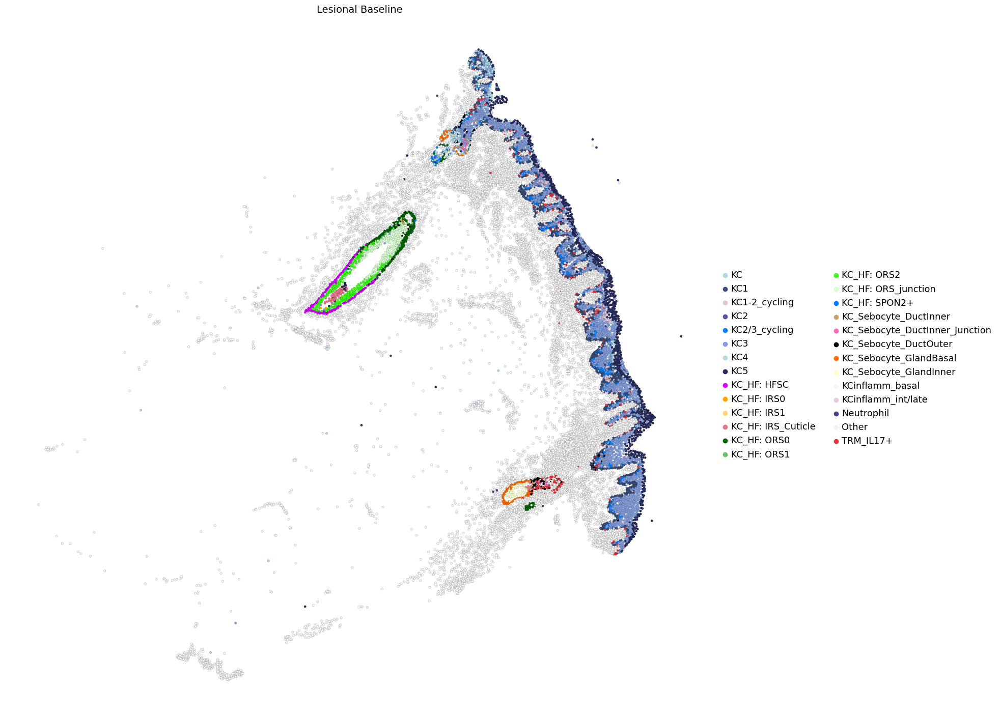

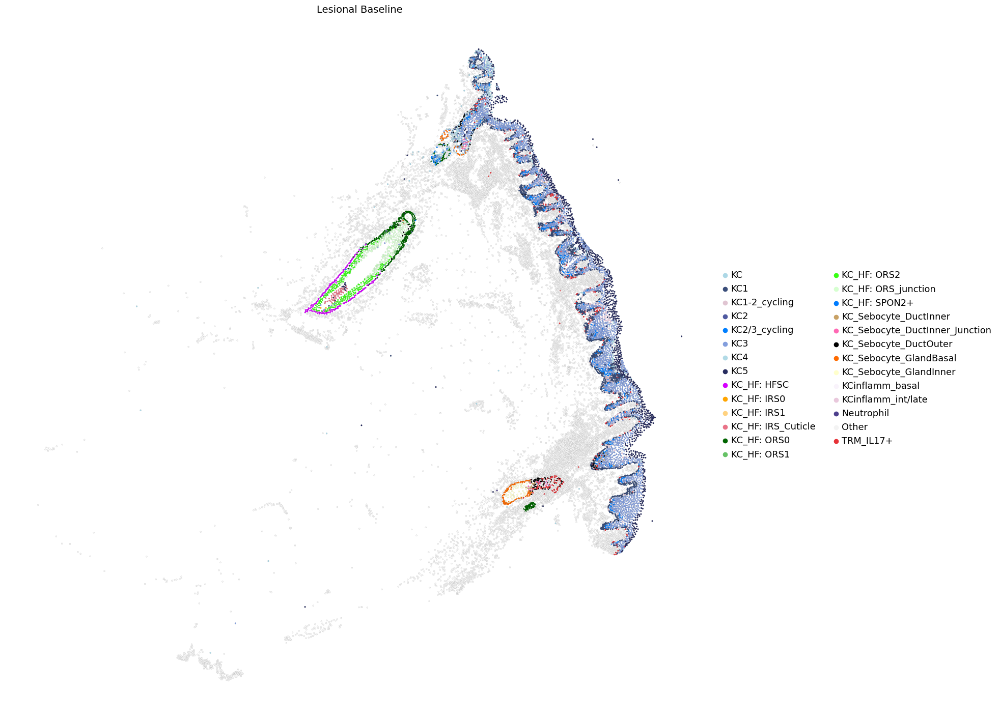

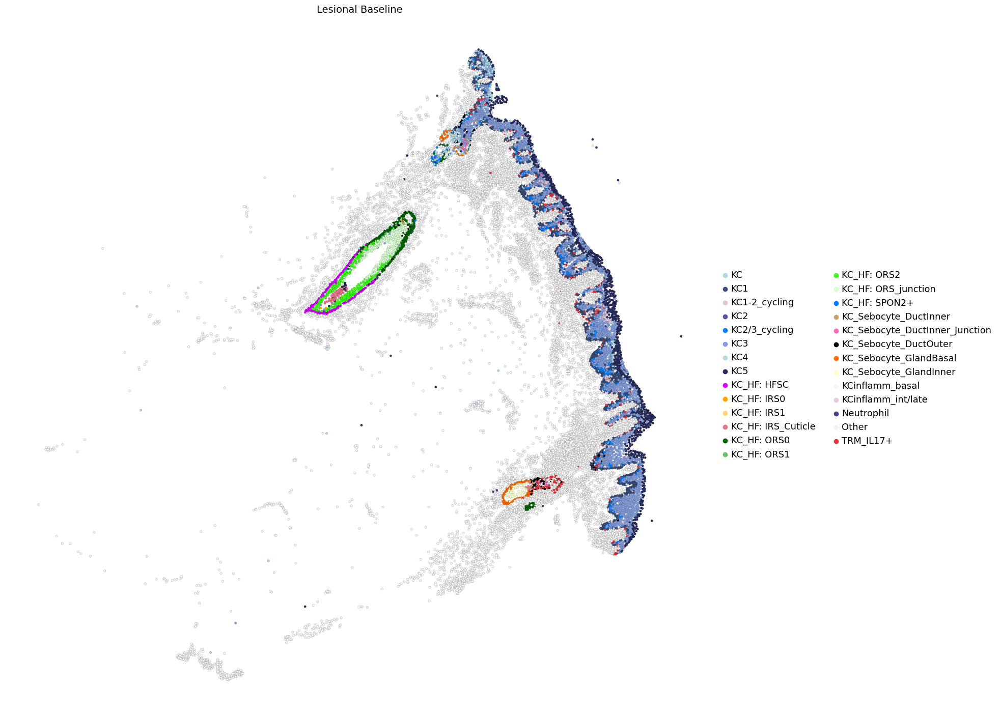

In [25]:
#sc.settings.set_figure_params(dpi=100, facecolor="white", frameon=False, figsize=(18,18))
SPOT_SIZE=15

fallback = "#BFBFBF"

# make column categorical (once)
adata_5k.obs["test"] = adata_5k.obs["test"].astype("category")

cat_order   = list(adata_5k.obs["test"].cat.categories)
palette_vec = [palette_dict.get(c, fallback) for c in cat_order]   # list, not dict
adata_5k.uns["test_colors"] = palette_vec


for sec in [ 'Lesional_CE4-SKI-27-FO-4-S22-A2']:
    ad_i = adata_5k[adata_5k.obs["info_id6"] == sec]
    #if CELL_TYPE not in ad_i.obs["test"].unique():
    #    continue
    #n = (ad_i.obs["test"] == CELL_TYPE).sum()
    #print(ad_i.shape, f"has cells ({CELL_TYPE}): ", n)
    #if n < MIN_CELL_COUNT:
    #    continue

    STATUS = ad_i.obs["Timepoint"].iloc[0]
    tissue_section_id = ad_i.obs["info_id2"].iloc[0]
    print(tissue_section_id)
#    
    sc.pl.spatial(
                    ad_i,
                    #library_id="spatial",
                    #shape=None,
                    color="test",
                    spot_size=SPOT_SIZE,
                    edgecolor="black",
                    linewidth=0.1,
                    vmax=1,
                    title=STATUS,# "\n" + tissue_section_id,
                   # save="fig1c.pdf"
                   # palette=cmap,

                    #ax=ax,
                    #legend_loc="on data"  # Disable the legend for each subplot
                )
    
    sc.pl.spatial(
                    ad_i,
                    #library_id="spatial",
                    #shape=None,
                    color="test",
                    spot_size=10,
                    edgecolor="black",
                    linewidth=0.05,
                    vmax=1,
                    title=STATUS,# + "\n" + tissue_section_id,
                   # save="fig1c_smaller.pdf"
                   # palette=cmap,

                    #ax=ax,
                    #legend_loc="on data"  # Disable the legend for each subplot
                )
    sc.pl.spatial(
                    ad_i,
                    #library_id="spatial",
                    #shape=None,
                    color="test",
                    spot_size=15,
                    edgecolor="black",
                    linewidth=0.1,
                    vmax=1,
                    title=STATUS,# + "\n" + tissue_section_id,
                    #save="fig1c_bigger.pdf"
                   # palette=cmaip,

                    #ax=ax,
                    #legend_loc="on data"  # Disable the legend for each subplot
                )

#sc.settings.set_figure_params(dpi=100, dpi_save=300, facecolor="white", frameon=False, figsize=(18,18))

    
    
    

Lesional_CE4-SKI-27-FO-4-S22-A2


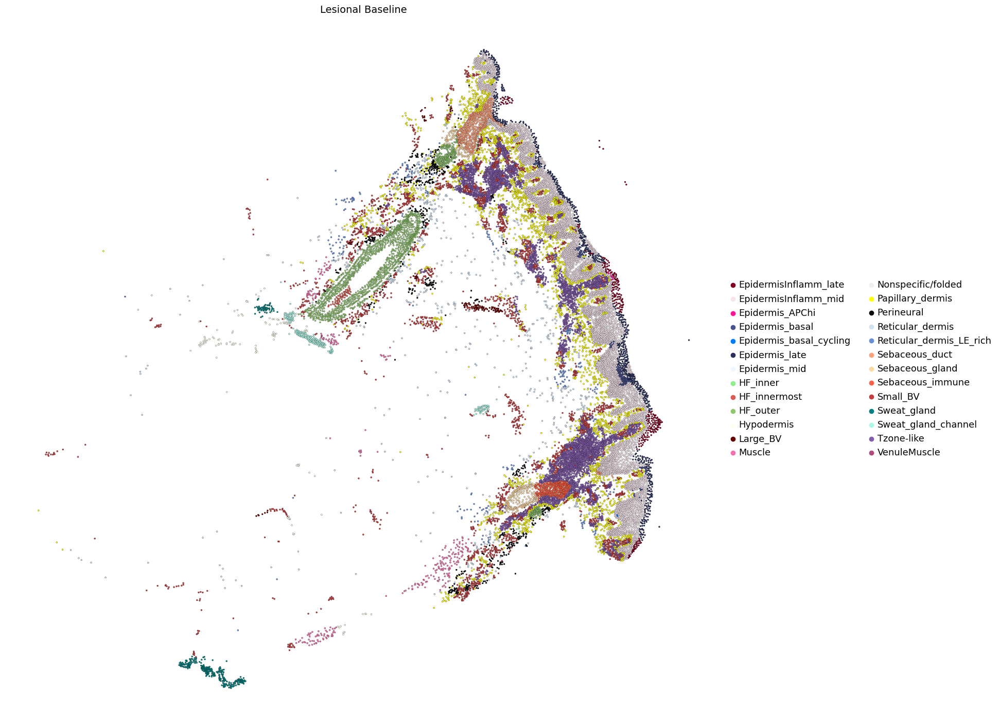

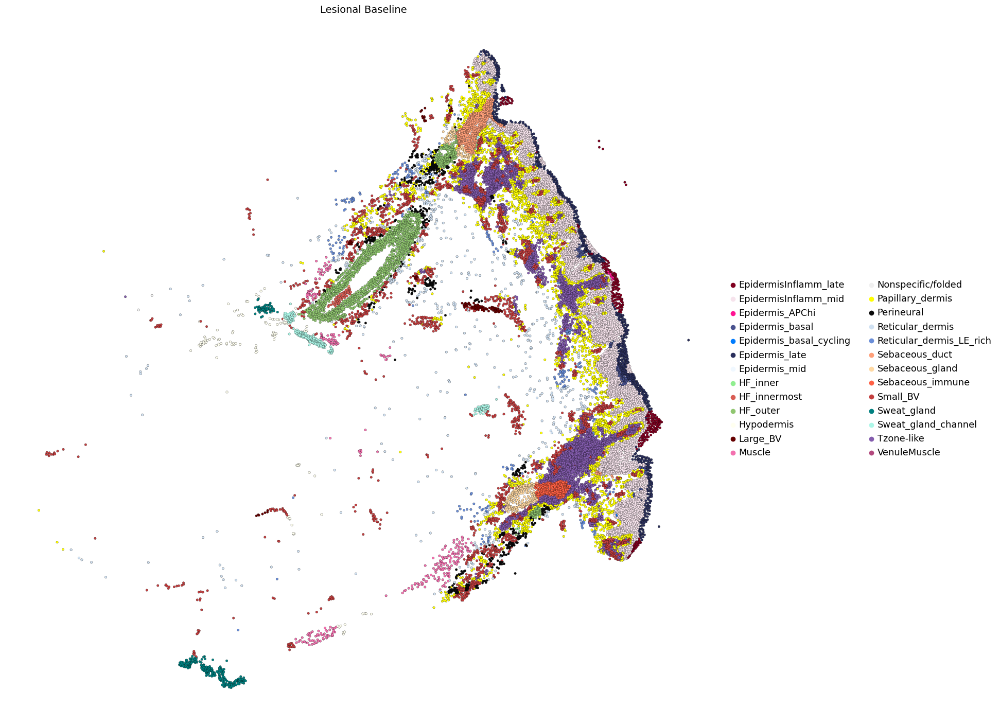

In [31]:
for sec in [ 'Lesional_CE4-SKI-27-FO-4-S22-A2']:
    ad_i = adata_5k[adata_5k.obs["info_id6"] == sec]
    #if CELL_TYPE not in ad_i.obs["test"].unique():
    #    continue
    #n = (ad_i.obs["test"] == CELL_TYPE).sum()
    #print(ad_i.shape, f"has cells ({CELL_TYPE}): ", n)
    #if n < MIN_CELL_COUNT:
    #    continue

    STATUS = ad_i.obs["Timepoint"].iloc[0]
    tissue_section_id = ad_i.obs["info_id2"].iloc[0]
    print(tissue_section_id)
#    
    sc.pl.spatial(
                    ad_i,
                    #library_id="spatial",
                    #shape=None,
                    color="niche19",
                    spot_size=10,
                    edgecolor="black",
                    linewidth=0.2,
                    vmax=1,
                    title=STATUS,# "\n" + tissue_section_id,
                   # save="fig1c.pdf"
                   # palette=cmap,

                    #ax=ax,
                    #legend_loc="on data"  # Disable the legend for each subplot
                )
    sc.pl.spatial(
                    ad_i,
                    #library_id="spatial",
                    #shape=None,
                    color="niche19",
                    spot_size=15,
                    edgecolor="black",
                    linewidth=0.2,
                    vmax=1,
                    title=STATUS,# "\n" + tissue_section_id,
                   # save="fig1c.pdf"
                   # palette=cmap,

                    #ax=ax,
                    #legend_loc="on data"  # Disable the legend for each subplot
                )
    
    

Lesional_CE3-SKI-24-FO-1-S22-A1


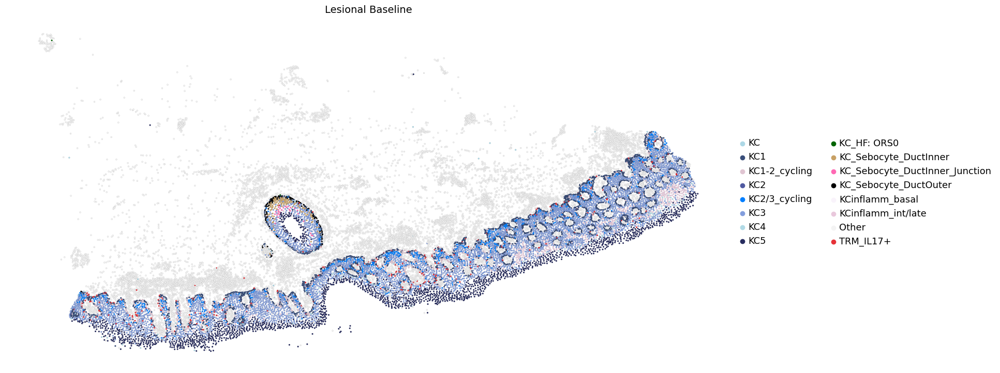

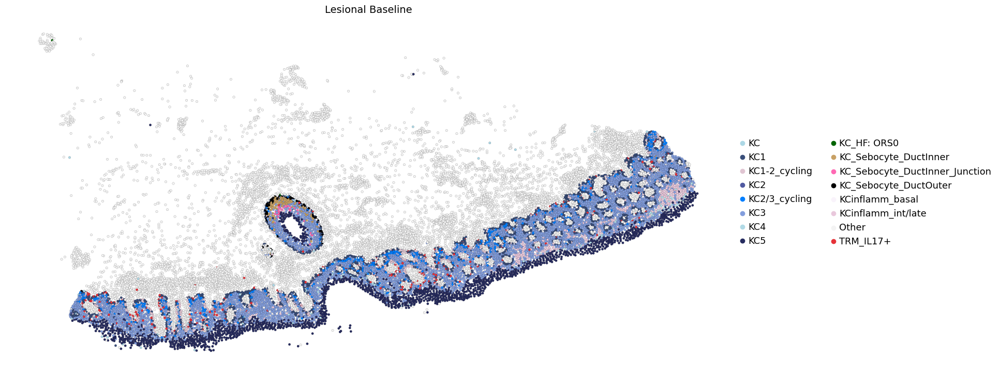

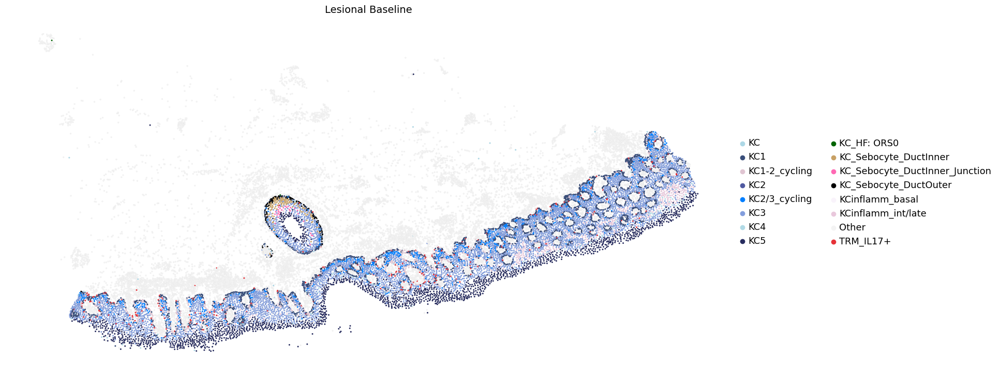

In [26]:
#sc.settings.set_figure_params(dpi=100, facecolor="white", frameon=False, figsize=(18,18))
SPOT_SIZE=5

fallback = "#BFBFBF"

# make column categorical (once)
adata_5k.obs["test"] = adata_5k.obs["test"].astype("category")

cat_order   = list(adata_5k.obs["test"].cat.categories)
palette_vec = [palette_dict.get(c, fallback) for c in cat_order]   # list, not dict
adata_5k.uns["test_colors"] = palette_vec


for sec in [ 'Lesional_CE3-SKI-24-FO-1-S22-A1' ]:
    ad_i = adata_5k[adata_5k.obs["info_id6"] == sec]
    #if CELL_TYPE not in ad_i.obs["test"].unique():
    #    continue
    #n = (ad_i.obs["test"] == CELL_TYPE).sum()
    #print(ad_i.shape, f"has cells ({CELL_TYPE}): ", n)
    #if n < MIN_CELL_COUNT:
    #    continue

    STATUS = ad_i.obs["Timepoint"].iloc[0]
    tissue_section_id = ad_i.obs["info_id2"].iloc[0]
    print(tissue_section_id)
#    
    sc.pl.spatial(
                    ad_i,
                    #library_id="spatial",
                    #shape=None,
                    color="test",
                    spot_size=10,
                    edgecolor="black",
                    linewidth=0.05,
                    vmax=1,
                    title=STATUS,# "\n" + tissue_section_id,
                   # save="fig1c.pdf"
                   # palette=cmap,

                    #ax=ax,
                    #legend_loc="on data"  # Disable the legend for each subplot
                )
    
    sc.pl.spatial(
                    ad_i,
                    #library_id="spatial",
                    #shape=None,
                    color="test",
                    spot_size=15,
                    edgecolor="black",
                    linewidth=0.1,
                    vmax=1,
                    title=STATUS,# + "\n" + tissue_section_id,
                   # save="fig1c_smaller.pdf"
                   # palette=cmap,

                    #ax=ax,
                    #legend_loc="on data"  # Disable the legend for each subplot
                )
    sc.pl.spatial(
                    ad_i,
                    #library_id="spatial",
                    #shape=None,
                    color="test",
                    spot_size=10,
                    edgecolor="black",
                    linewidth=0.01,
                    vmax=1,
                    title=STATUS,# + "\n" + tissue_section_id,
                    #save="fig1c_bigger.pdf"
                   # palette=cmaip,

                    #ax=ax,
                    #legend_loc="on data"  # Disable the legend for each subplot
                )

#sc.settings.set_figure_params(dpi=100, dpi_save=300, facecolor="white", frameon=False, figsize=(18,18))

    
    
    